In [ ]:
from google.colab import drive
drive.mount("/content/drive")
import os

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/Colab-Notebooks/LLM-Project

/content/drive/MyDrive/Colab-Notebooks/LLM-Project


In [ ]:
!pip install -q --upgrade datasets huggingface_hub fsspec

In [ ]:
from datasets import load_from_disk
ds = load_from_disk("/content/drive/MyDrive/Colab-Notebooks/LLM-Project/datasets/20_newsgroups_ds")
ds

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'label_text', 'text_clean', 'text_lemm', 'tokens', 'tokens_nostop'],
        num_rows: 11314
    })
    test: Dataset({
        features: ['text', 'label', 'label_text', 'text_clean', 'text_lemm', 'tokens', 'tokens_nostop'],
        num_rows: 7532
    })
})

In [46]:
import pandas as pd
import numpy as np

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
ds_train = pd.DataFrame(ds['train'])
ds_test = pd.DataFrame(ds['test'])

In [18]:
def no_1letter(tokens):
    # tokens is already a list; return only those longer than 1 char
    return [t for t in tokens if len(t) > 1]

vectorizer = TfidfVectorizer(
    tokenizer = no_1letter,
    preprocessor = lambda x: x,   # do nothing; data already clean
    token_pattern = None,         # must disable the regex tokenizer
    max_df = 0.95,
    min_df = 2
)

X = vectorizer.fit_transform(ds_train['tokens_nostop'].values)
X_test  = vectorizer.transform(ds_test['tokens_nostop'])

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV

pipe = Pipeline([
    ("tfidf", vectorizer),
    ("clf",  LinearSVC())
])

param_grid = {
    "tfidf__ngram_range": [(1,1), (1,2)],
    "clf__C": [0.1, 1, 10]
}

search = GridSearchCV(pipe, param_grid, cv=5, n_jobs=-1, scoring="accuracy")
search.fit(ds_train['tokens_nostop'], ds_train['label_text'])
print("best →", search.best_score_, search.best_params_)

best → 0.7604737418503095 {'clf__C': 1, 'tfidf__ngram_range': (1, 2)}


In [ ]:
feature_names = vectorizer.vocabulary_
tfidf_features =  pd.DataFrame(X.toarray(), columns=feature_names)
tfidf_features.head()

,wonder,anyone,could,enlighten,car,see,day,door,sport,look,...,ufos,dataframe,ashley,devotional,embe,collosion,laparoscopic,blanking,variability,blueprint
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
import pickle
best_model = search.best_estimator_
filename = './models/best_model.sav'
pickle.dump(best_model, open(filename, 'wb'))

In [ ]:
print('Vocabulary:', vectorizer.vocabulary_)
print('IDF Values:', vectorizer.idf_)

Vocabulary: {'wonder': 27483, 'anyone': 1077, 'could': 5167, 'enlighten': 7762, 'car': 3495, 'see': 22142, 'day': 5810, 'door': 6910, 'sport': 23340, 'look': 14402, 'late': 13811, 'early': 7229, 'call': 3376, 'bricklin': 2987, 'really': 20434, 'small': 22894, 'addition': 275, 'front': 9332, 'bumper': 3169, 'separate': 22240, 'rest': 21007, 'body': 2728, 'know': 13513, 'model': 15954, 'name': 16622, 'engine': 7741, 'spec': 23225, 'year': 28214, 'production': 19552, 'make': 14773, 'history': 10999, 'whatever': 27212, 'info': 12069, 'funky': 9426, 'please': 18975, 'mail': 14736, 'fair': 8442, 'number': 17335, 'brave': 2932, 'soul': 23134, 'upgrade': 26153, 'si': 22577, 'clock': 4287, 'oscillator': 17931, 'share': 22399, 'experience': 8288, 'poll': 19100, 'send': 22213, 'brief': 2994, 'message': 15405, 'detail': 6276, 'procedure': 19527, 'top': 25052, 'speed': 23263, 'attain': 1623, 'cpu': 5248, 'rate': 20322, 'add': 266, 'card': 3508, 'adapter': 261, 'heat': 10743, 'sink': 22692, 'hour': 

In [19]:
from sklearn.decomposition import NMF

k = 20         # try a grid: 10, 20, 30…
nmf = NMF(
    n_components = k,
    init="nndsvd",     # good starting point for sparse data
    random_state=42,
    max_iter=400
).fit(X)


# Top words per topic
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf.components_):
    top_terms = [feature_names[i] for i in topic.argsort()[-10:][::-1]]
    print(f"Topic {topic_idx:2d}: {'  '.join(top_terms)}")


Topic  0: say  think  get  go  one  know  see  people  well  thing
Topic  1: thank  please  anyone  mail  know  advance  hi  post  info  email
Topic  2: game  team  player  play  win  year  season  hockey  league  score
Topic  3: key  chip  encryption  clipper  bit  escrow  algorithm  phone  encrypt  government
Topic  4: drive  disk  floppy  hard  boot  cd  format  cable  jumper  ide
Topic  5: geb  dsl  cadre  chastity  njxp  pitt  shameful  intellect  skepticism  surrender
Topic  6: window  run  manager  application  program  ms  display  server  version  screen
Topic  7: god  jesus  christian  believe  bible  faith  christ  belief  say  church
Topic  8: card  driver  video  monitor  color  vga  graphic  mode  ati  diamond
Topic  9: gun  law  government  right  people  crime  weapon  state  firearm  criminal
Topic 10: space  new  include  sale  offer  price  sell  nasa  edu  list
Topic 11: car  buy  dealer  engine  mile  price  driver  speed  good  model
Topic 12: file  ftp  format  p

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from sklearn import decomposition

def plot_wordcloud(text, title, k=10):
  # Create and Generate a Word Cloud Image
  wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(text)
  # top k words
  plt.figure(figsize=(10,5))
  print(f'category {cat}, top {k} words: {list(wordcloud.words_.keys())[:k]}')
  ax = sns.barplot(x=0, y=1, data=pd.DataFrame(wordcloud.words_.items()).head(k))
  ax.set(xlabel = 'words', ylabel='count', title=title)
  plt.show()
  #Display the generated image
  plt.figure(figsize=(15,15))
  plt.imshow(wordcloud, interpolation="bilinear"), plt.title(title, size=20), plt.axis("off")
  plt.show()


In [37]:
vectors = X # (documents, vocab)
vocab = np.array(vectorizer.get_feature_names_out())

nmf = NMF(
    n_components=k,
    random_state=0,
    init = "nndsvda"
    )

X_train   = vectorizer.fit_transform(ds_train["tokens_nostop"])
X_test    = vectorizer.transform(ds_test["tokens_nostop"])   # <─ key line

# NMF topics
W_train = nmf.fit_transform(X_train)     # fit on train
W_test  = nmf.transform(X_test)         # transform test

# linear SVM head
from sklearn.svm import LinearSVC
clf = LinearSVC().fit(W_train, ds_train["label"])  # numeric is faster/safer
acc  = clf.score(W_test,  ds_test["label"])
print(f"accuracy: {acc:.3f}")

accuracy: 0.415


category rec.autos, top 10 words: ['car', 'will', 'one', 'good', 'time', 'new', 'engine', 'year', 'much', 'may']


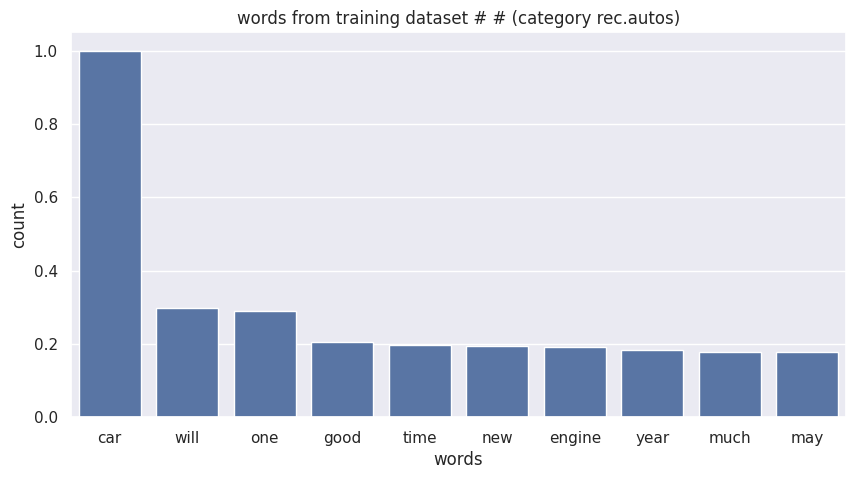

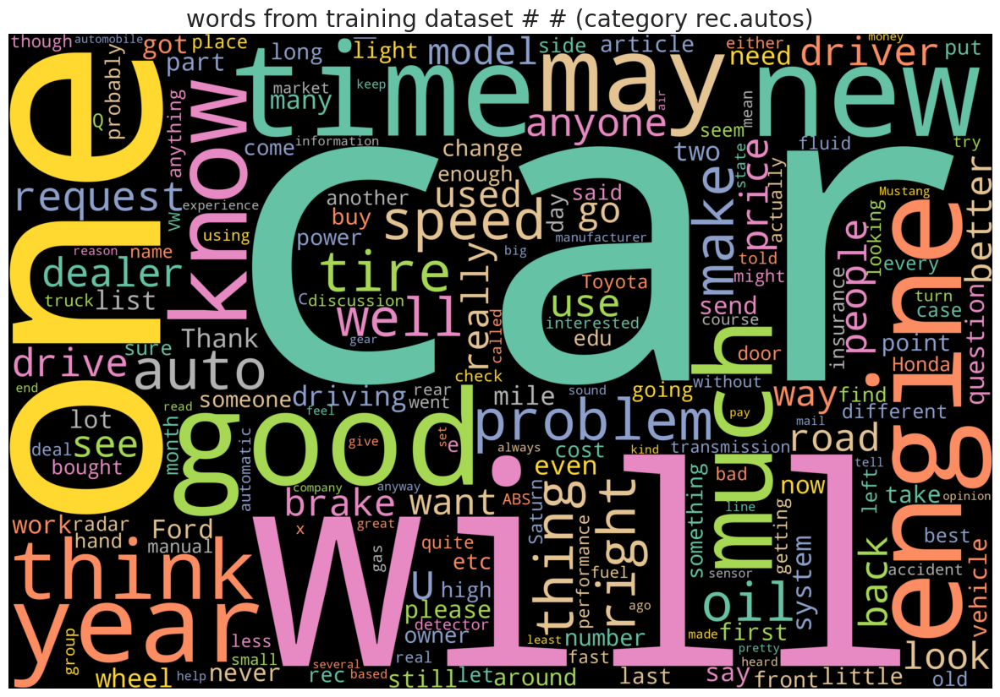

category comp.sys.mac.hardware, top 10 words: ['Mac', 'drive', 'Apple', 'one', 'problem', 'use', 'will', 'card', 'know', 'system']


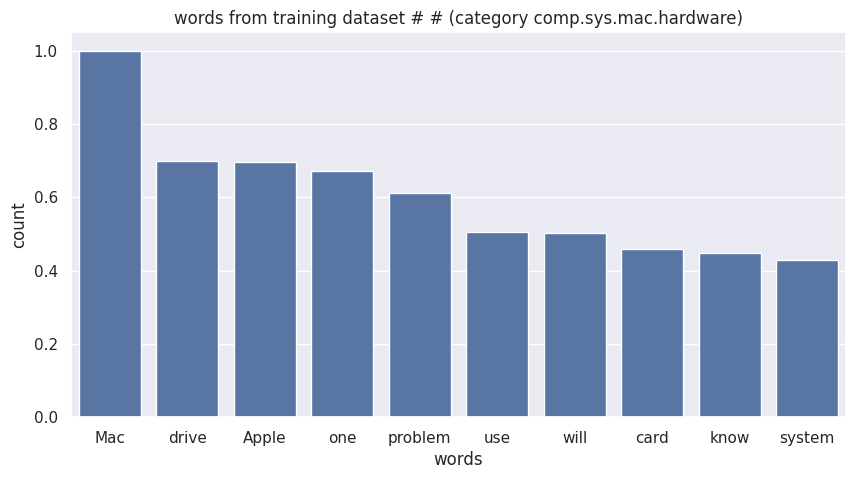

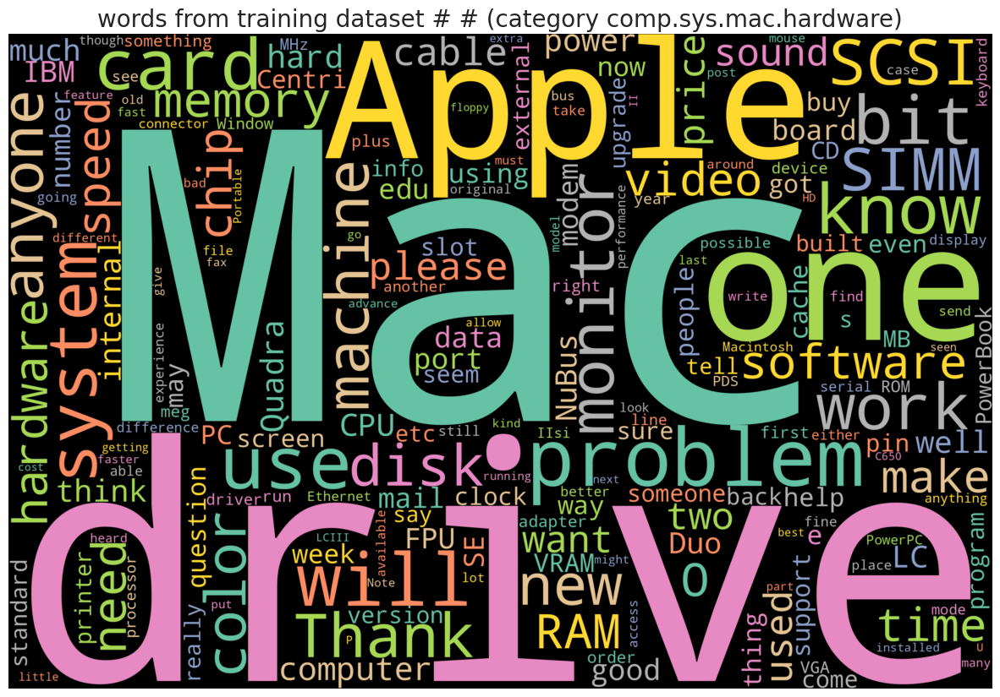

category comp.graphics, top 10 words: ['image', 'file', 'graphic', 'will', 'edu', 'program', 'JPEG', 'format', 'x', 'use']


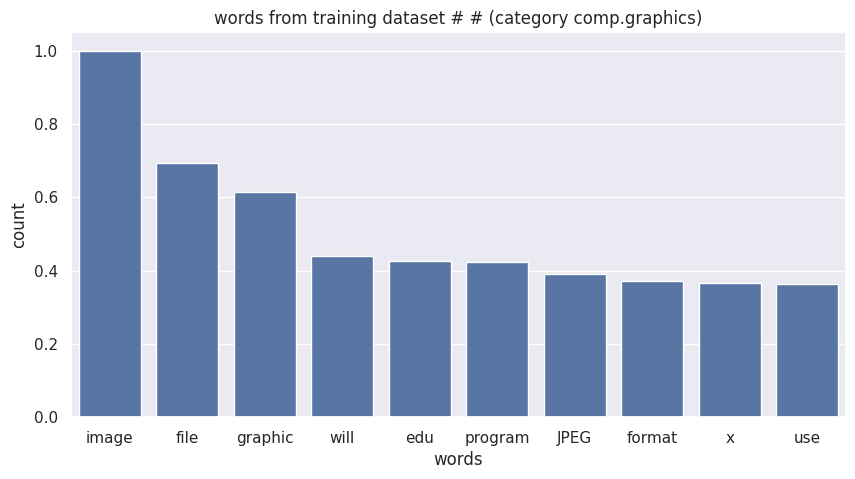

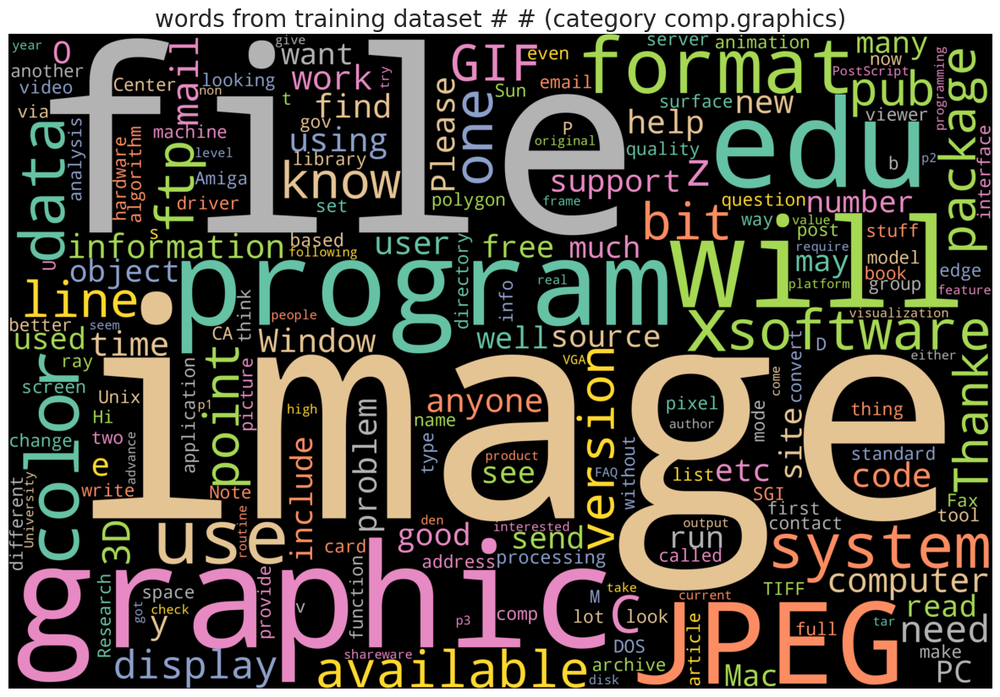

category sci.space, top 10 words: ['space', 'will', 'NASA', 'one', 'satellite', 'year', 'launch', 'system', 'time', 'U']


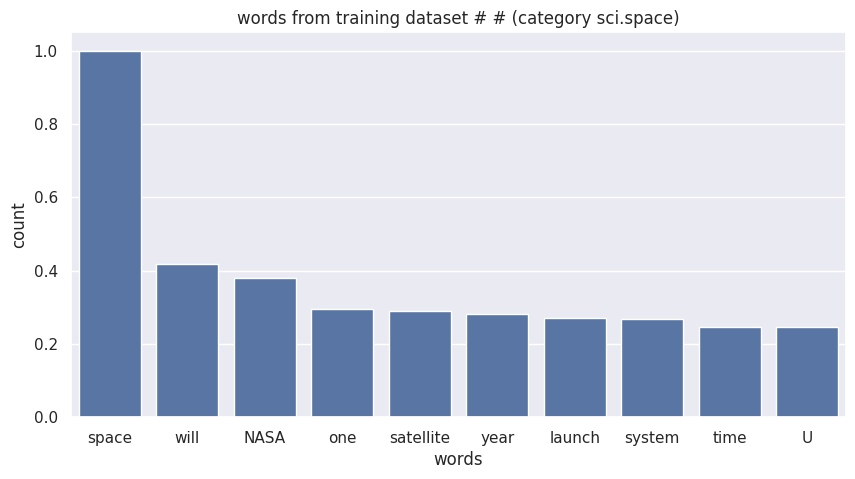

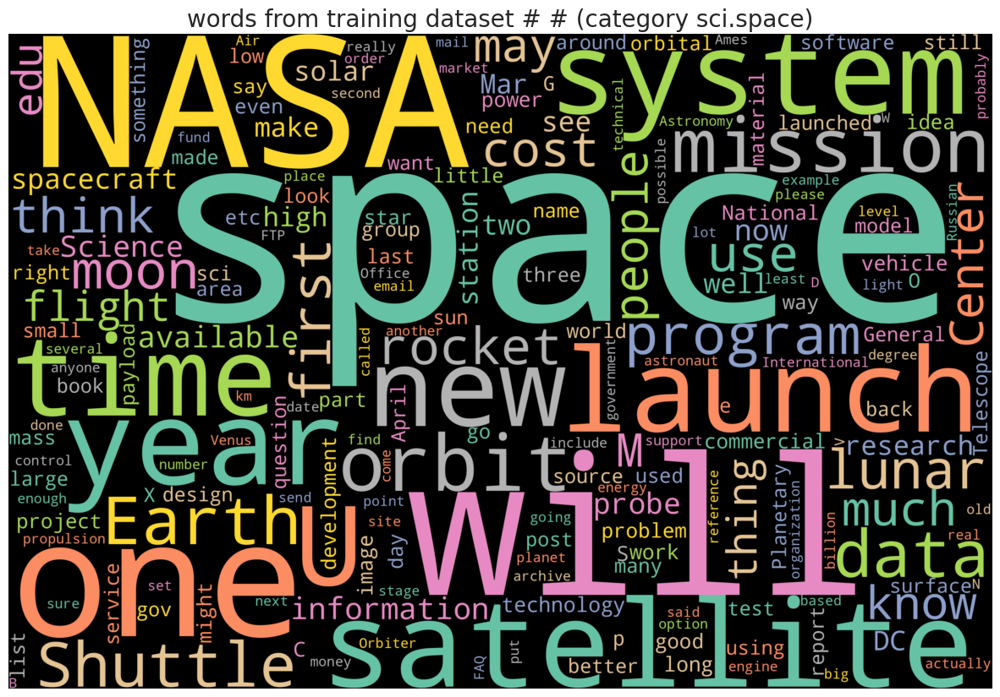

category talk.politics.guns, top 10 words: ['gun', 'people', 'one', 'firearm', 'weapon', 'M', 'File', 'law', 'U', 'right']


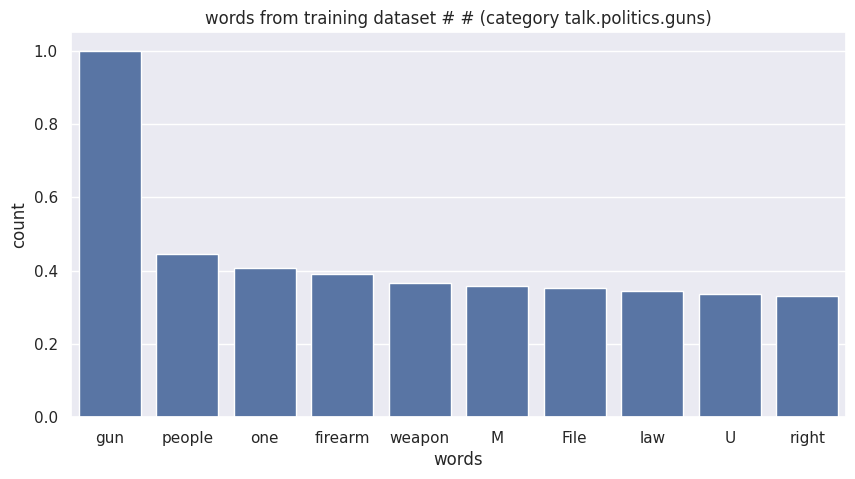

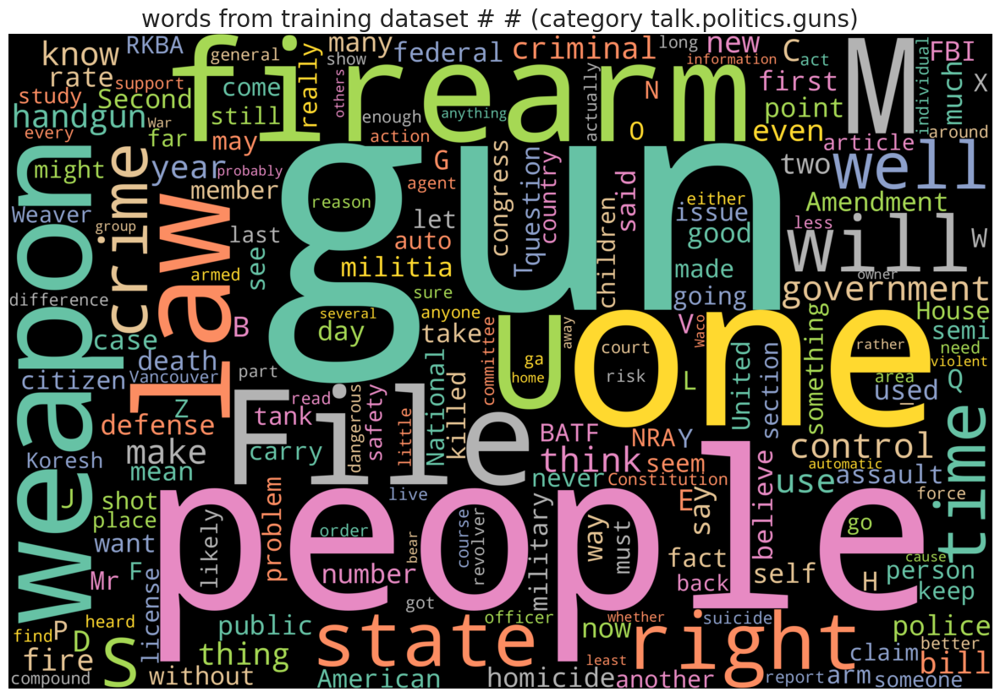

category sci.med, top 10 words: ['one', 'edu', 'will', 'patient', 'use', 'people', 'time', 'Health', 'disease', 'year']


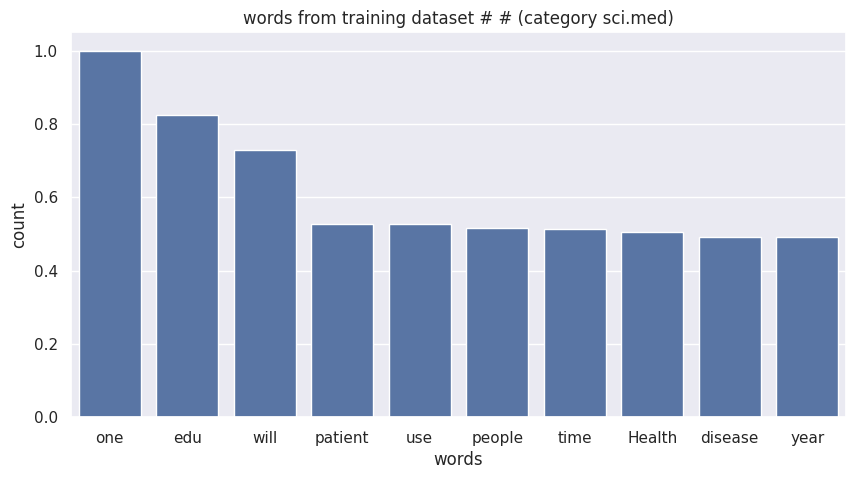

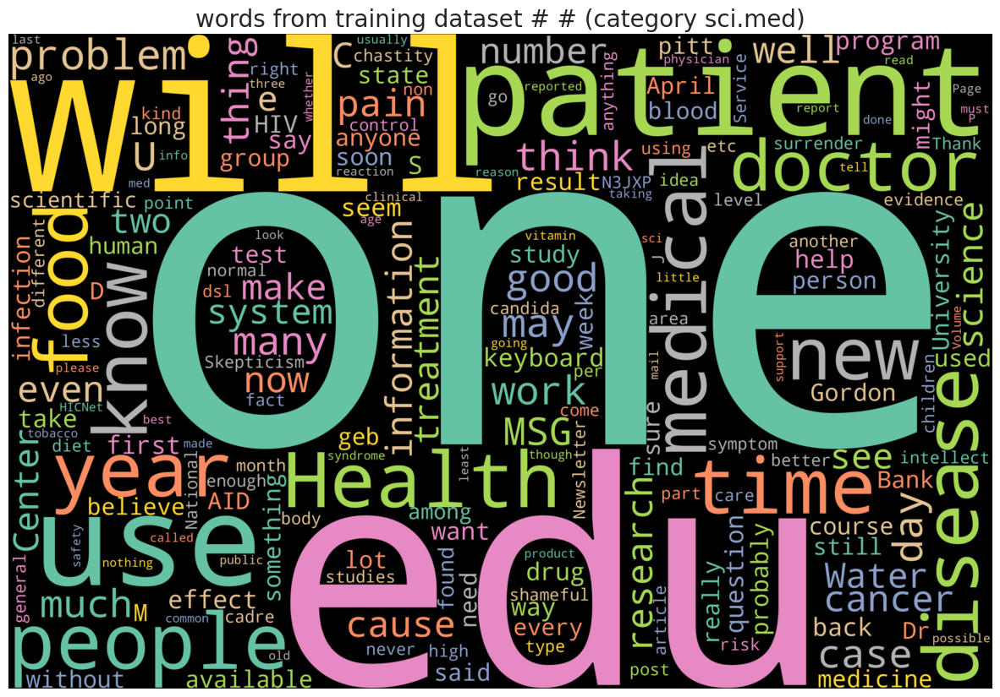

category comp.sys.ibm.pc.hardware, top 10 words: ['drive', 'SCSI', 'card', 'system', 'disk', 'use', 'one', 'controller', 'will', 'problem']


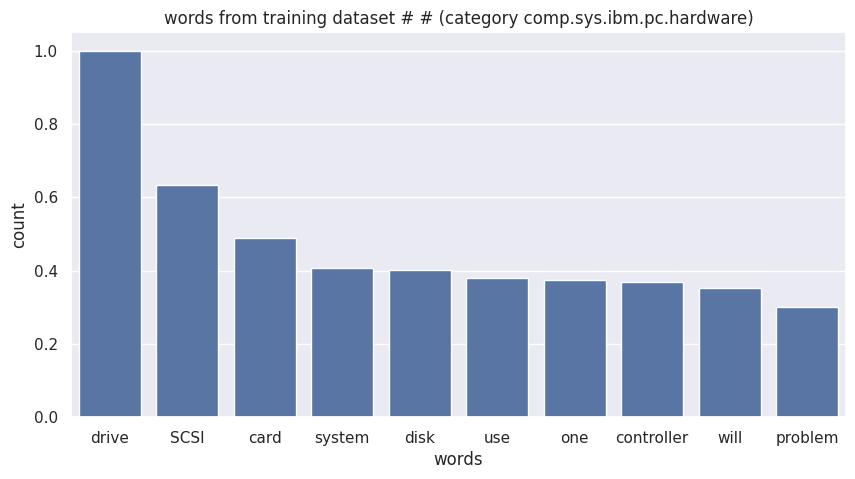

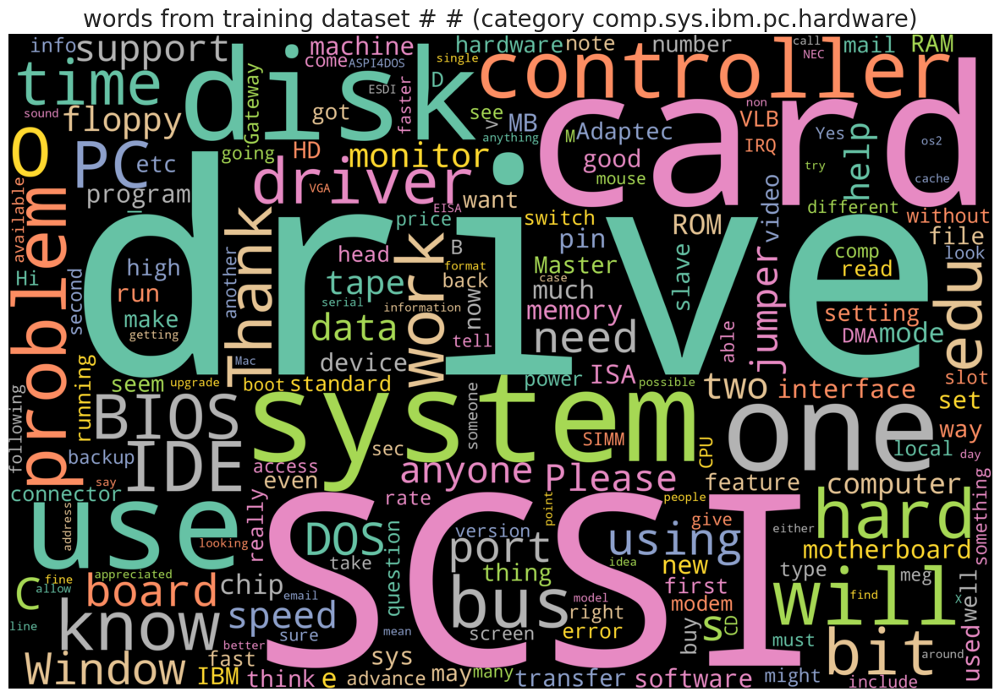

category comp.os.ms-windows.misc, top 10 words: ['AX', 'M', 'Q', 'MAX', 'W', 'P', 'G', 'V', 'S', 'Z']


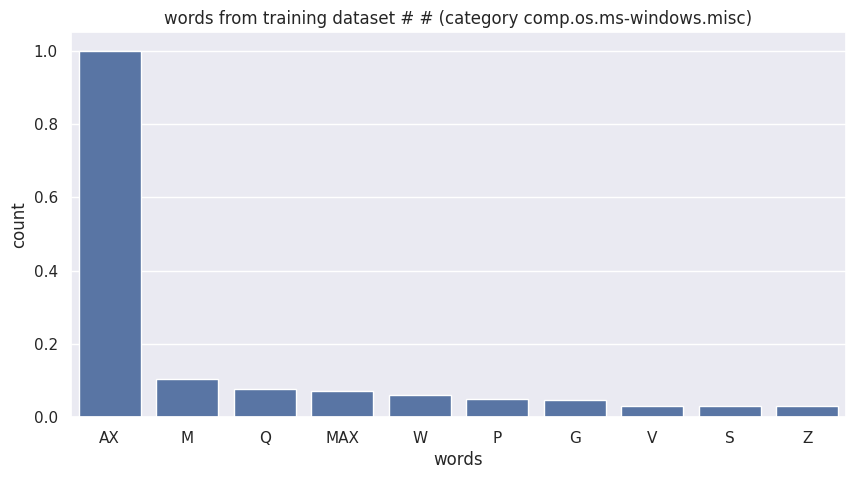

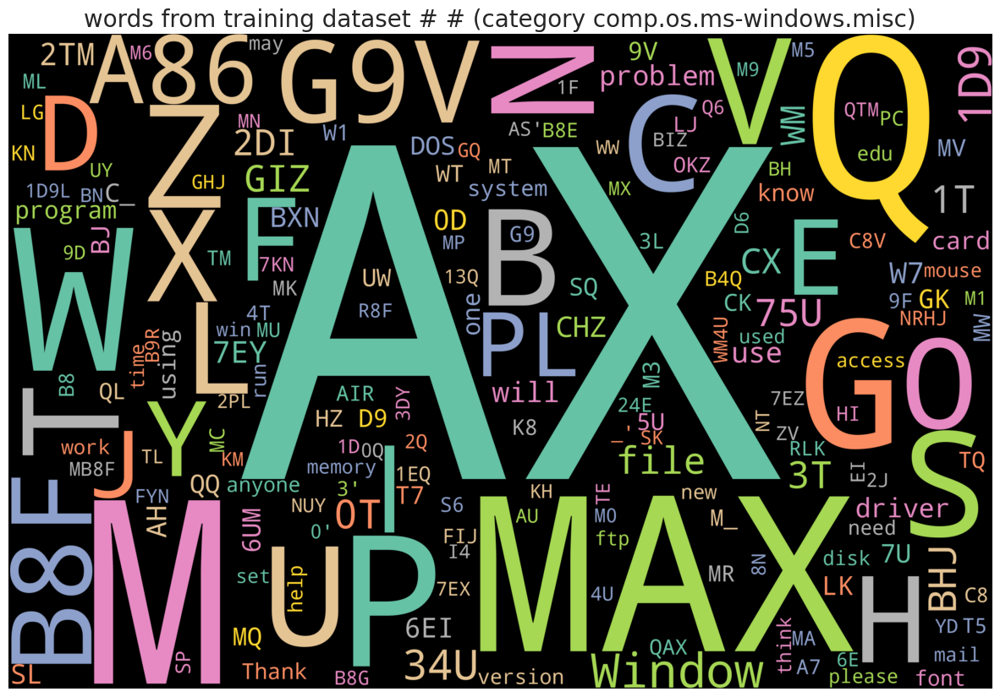

category rec.motorcycles, top 10 words: ['bike', 'one', 'DoD', 'motorcycle', 'know', 'will', 'ride', 'time', 'good', 'well']


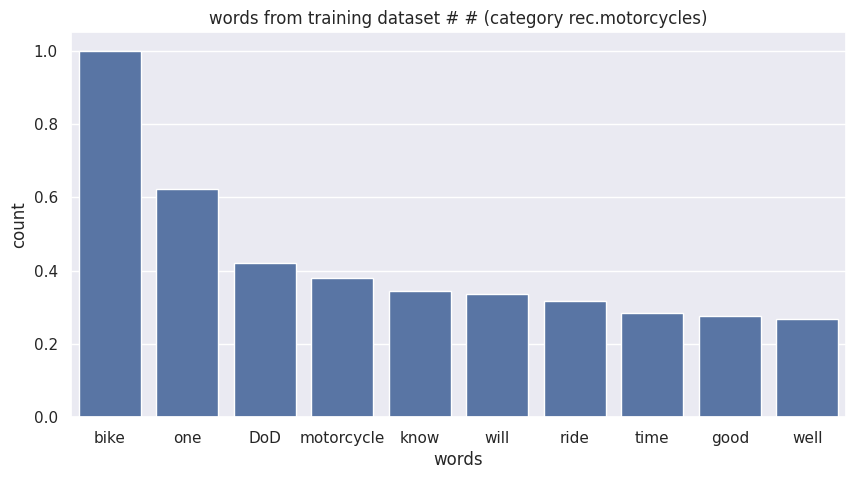

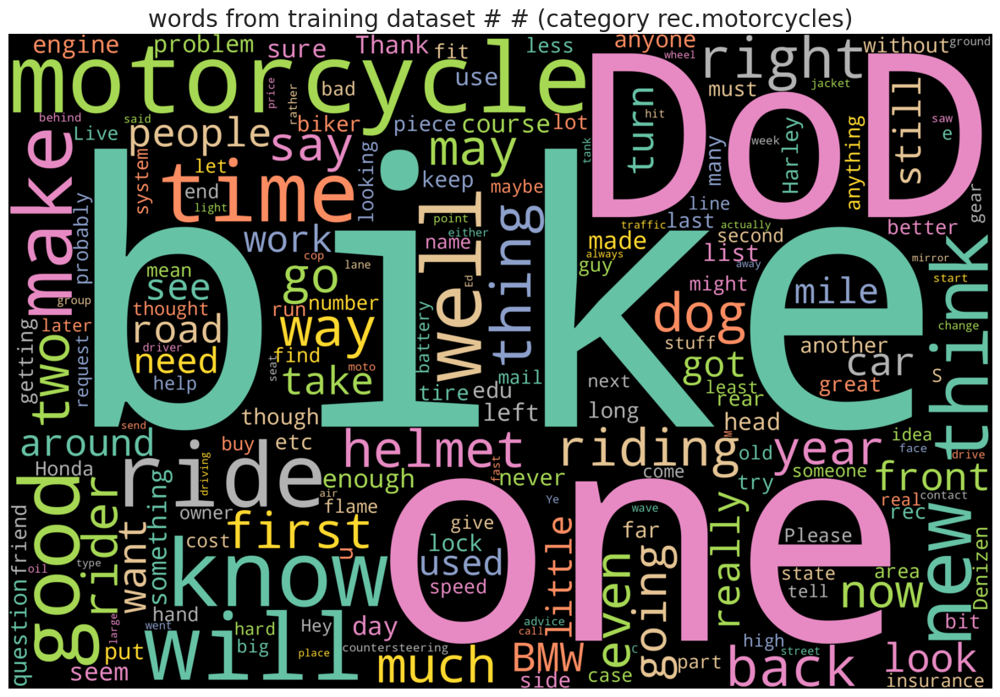

category talk.religion.misc, top 10 words: ['God', 'one', 'people', 'will', 'Jesus', 'Christian', 'say', 'think', 'Bible', 'know']


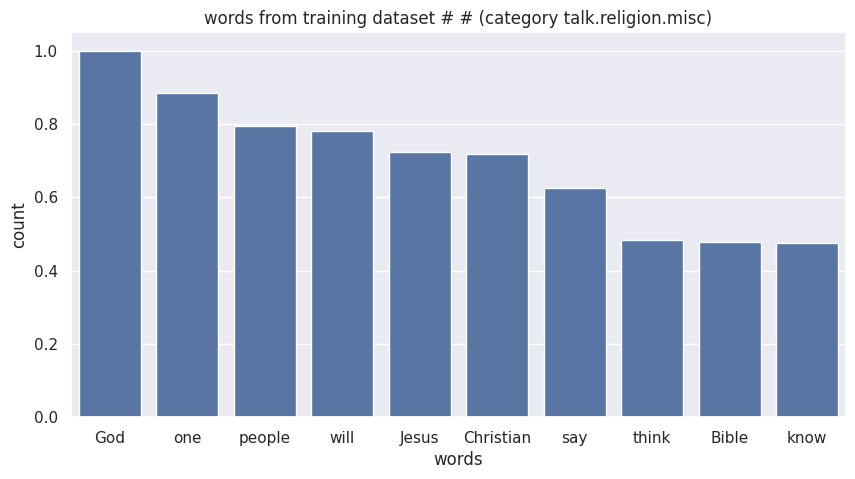

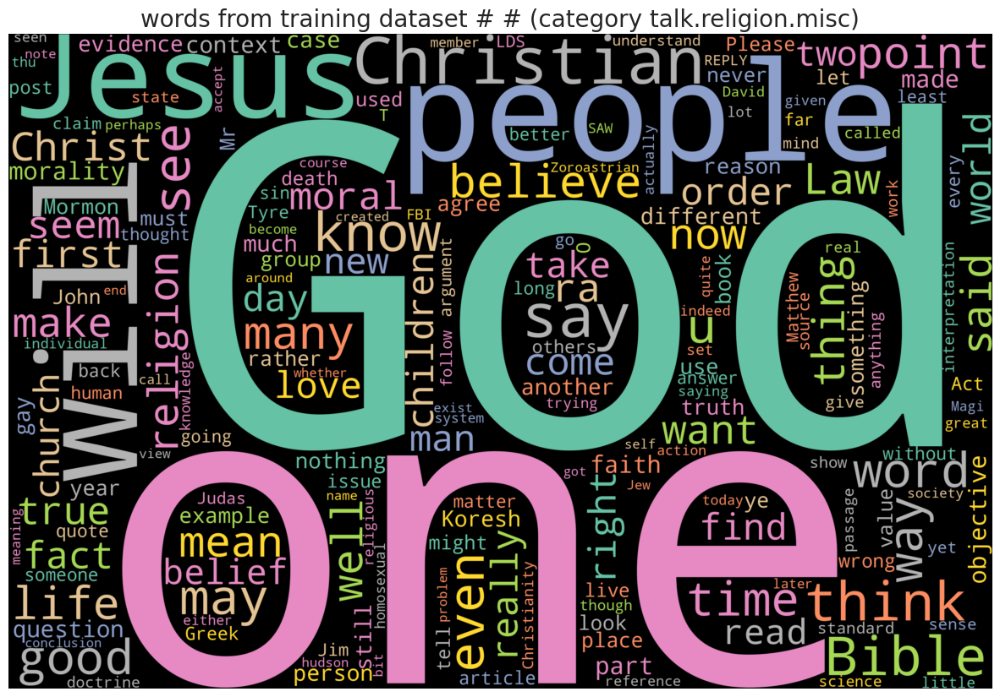

category misc.forsale, top 10 words: ['new', 'sale', 'offer', 'will', 'DOS', 'price', 'shipping', 'one', 'please', 'game']


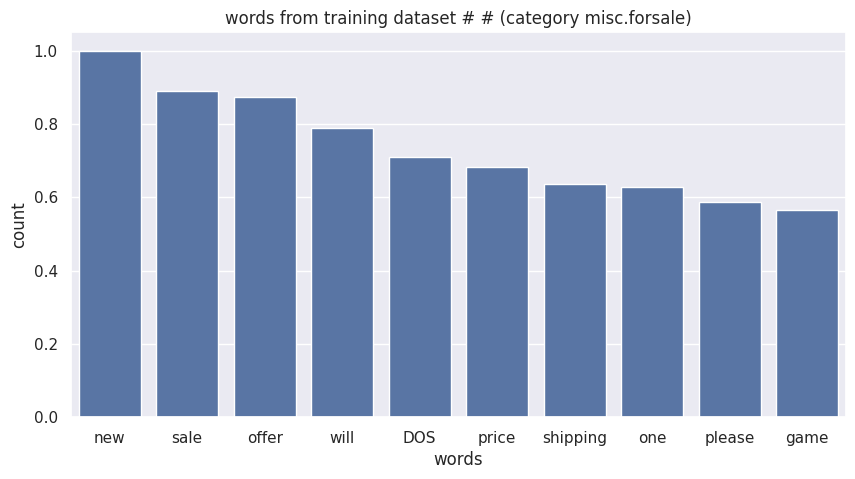

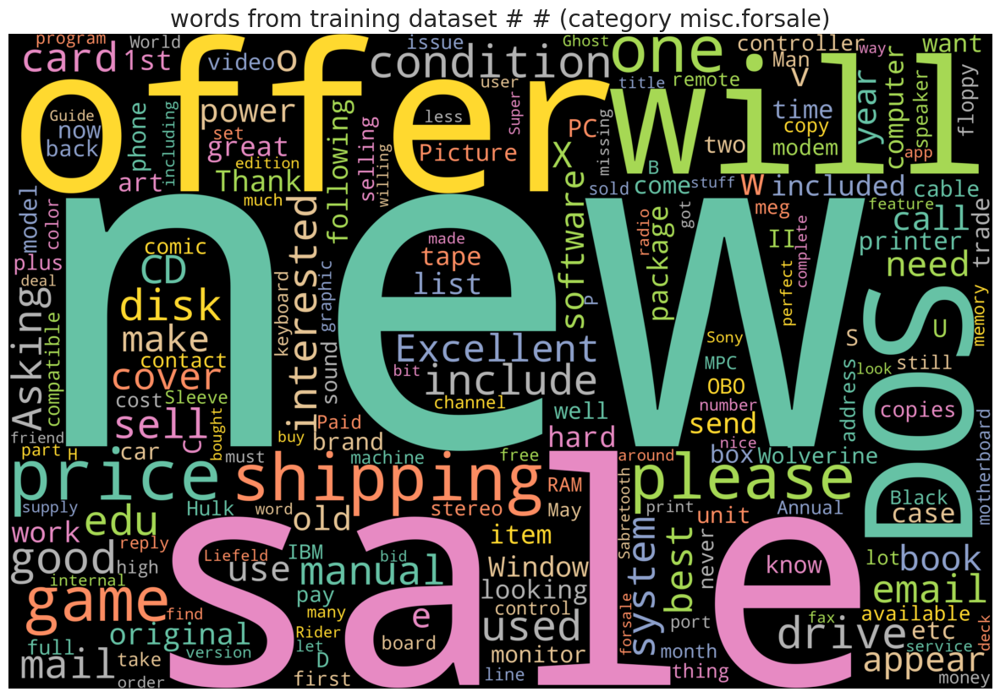

category alt.atheism, top 10 words: ['God', 'one', 'people', 'will', 'atheist', 'think', 'say', 'atheism', 'religion', 'argument']


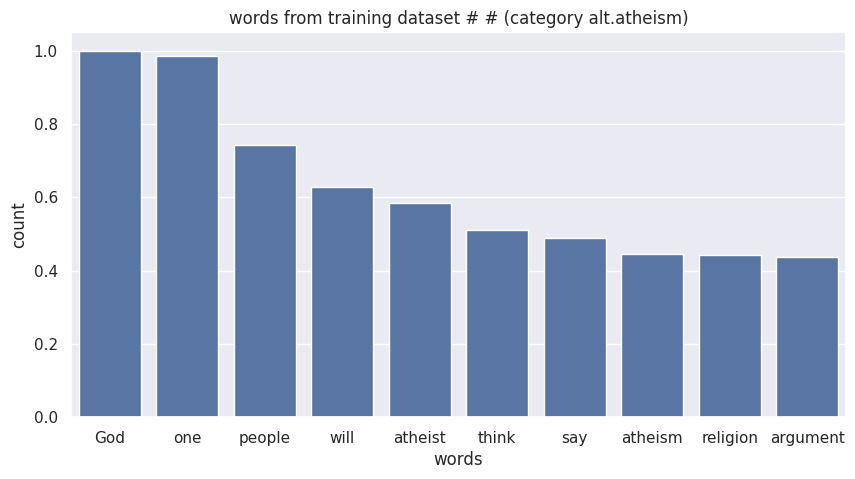

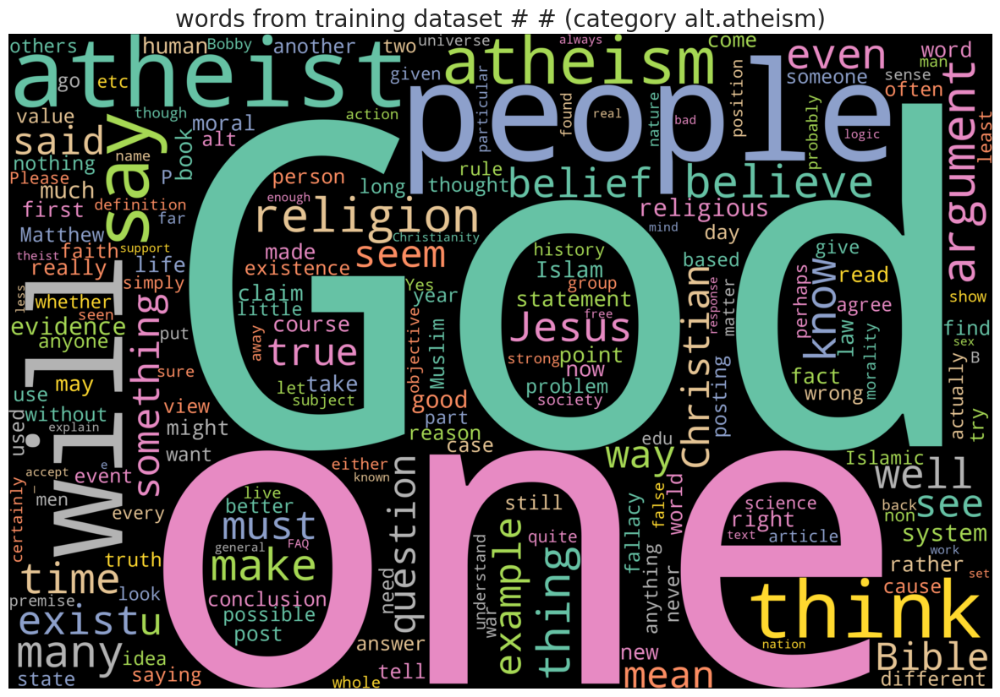

category sci.electronics, top 10 words: ['one', 'use', 'will', 'wire', 'circuit', 'power', 'ground', 'know', 'used', 'work']


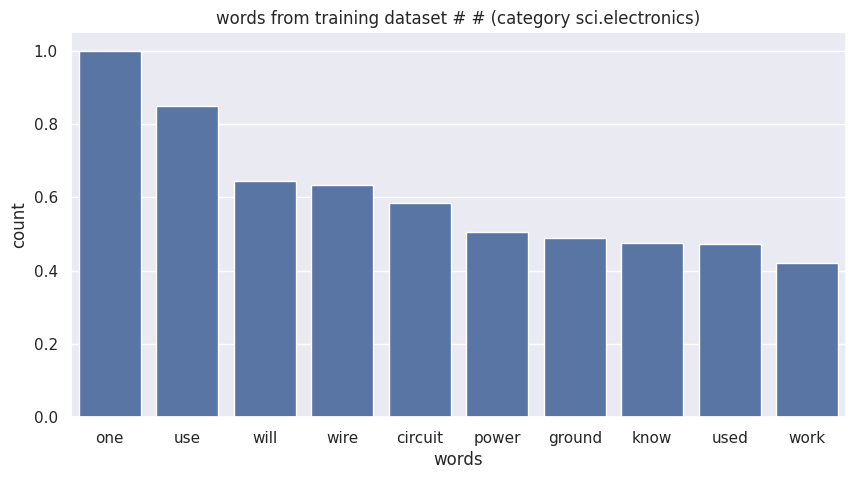

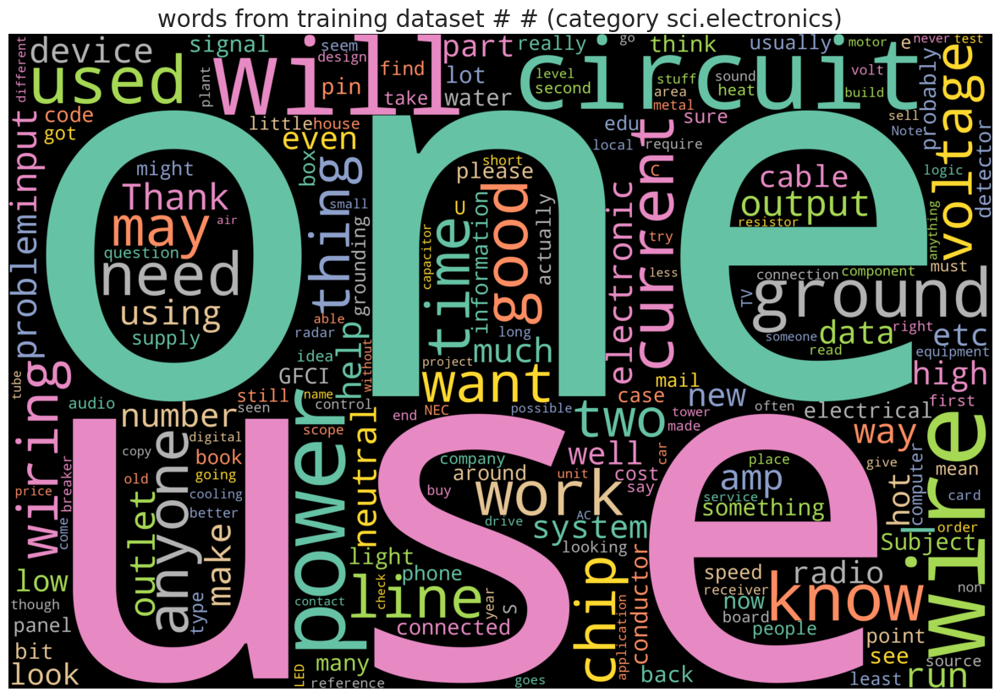

category comp.windows.x, top 10 words: ['X', 'file', 'window', 'use', 'program', 'C', 'widget', 'server', 'will', 'n']


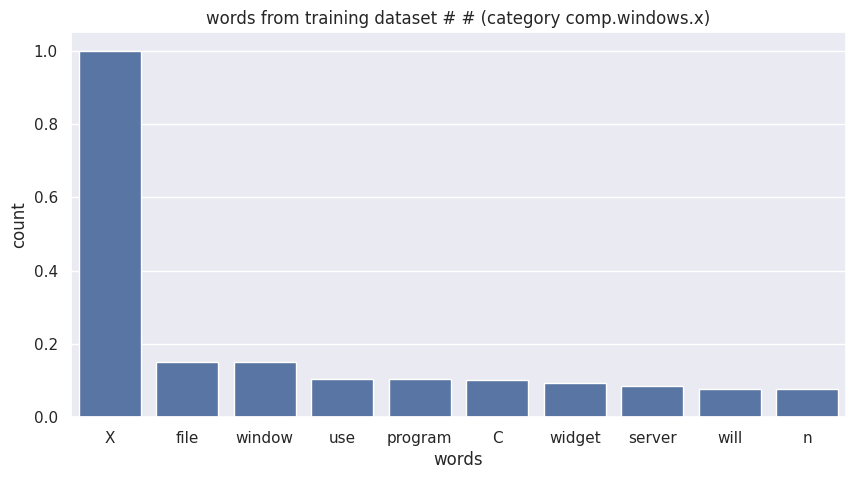

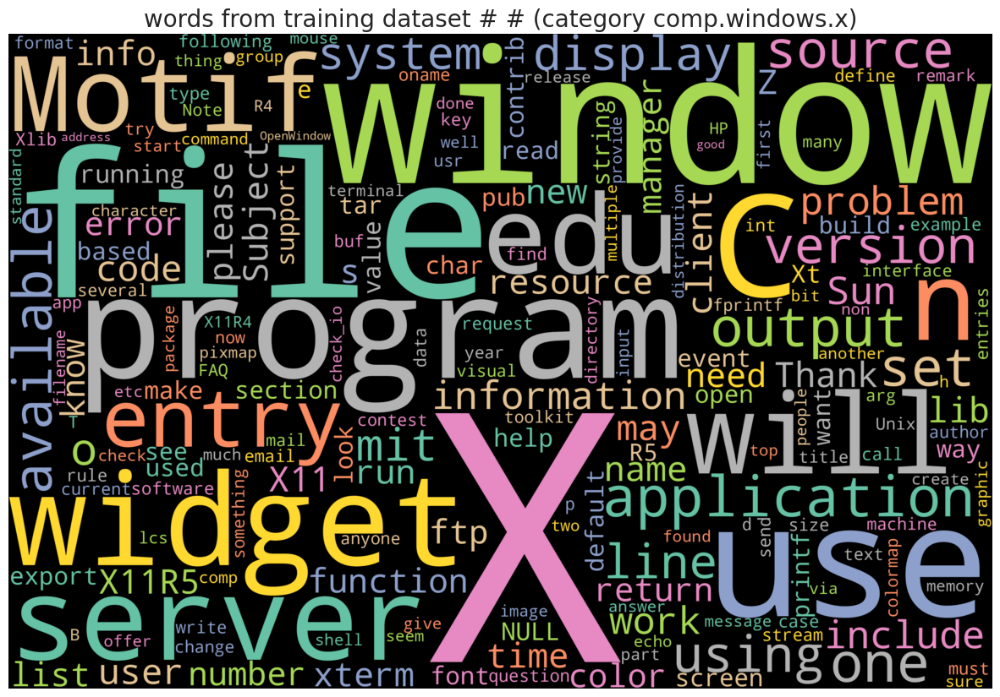

category rec.sport.hockey, top 10 words: ['game', 'team', 'will', 'play', 'hockey', 'player', 'season', 'year', 'pt', 'period']


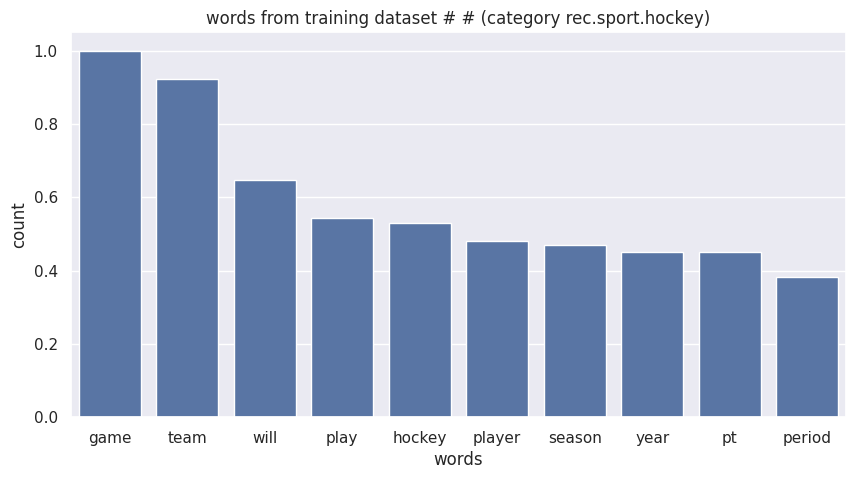

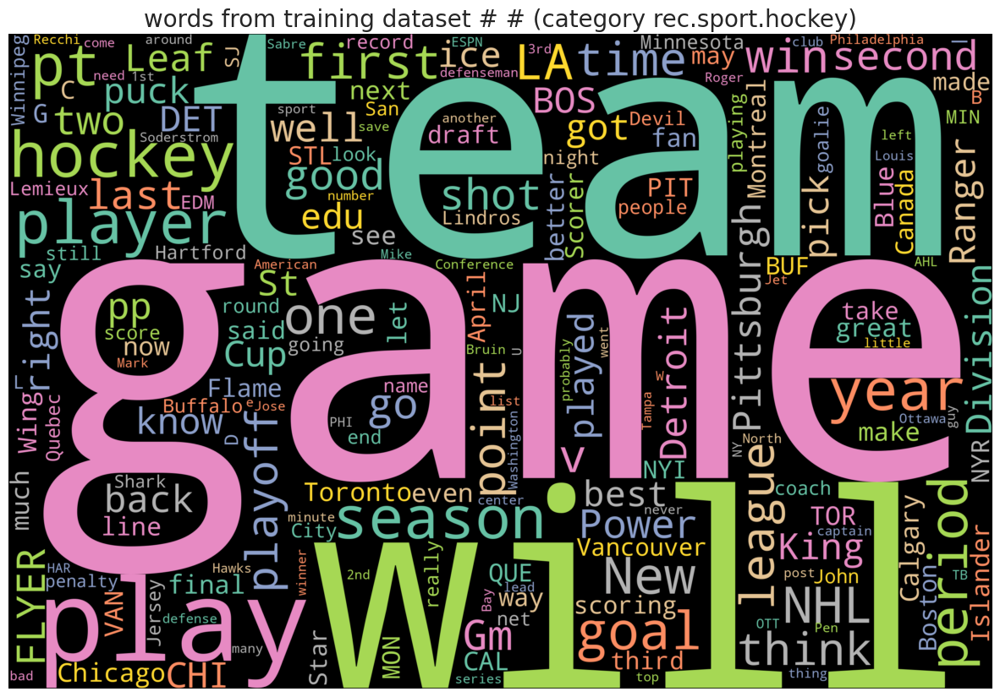

category rec.sport.baseball, top 10 words: ['year', 'game', 'team', 'one', 'run', 'player', 'will', 'good', 'think', 'last']


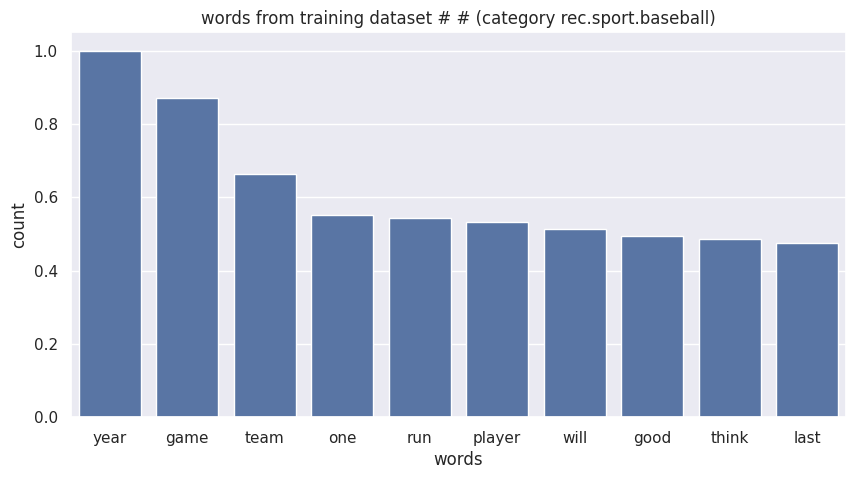

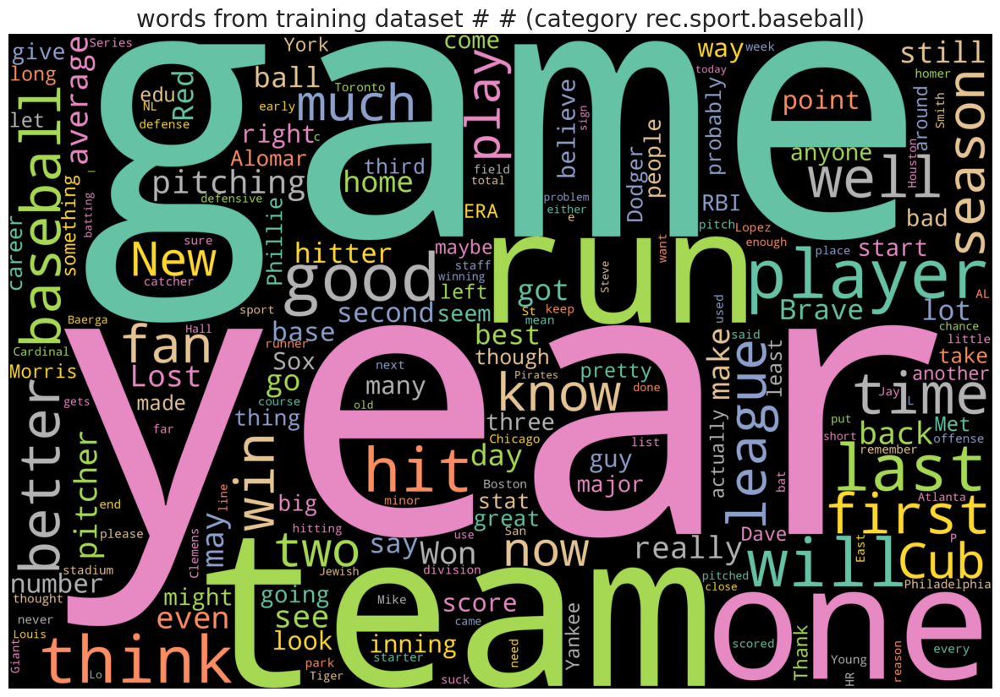

category soc.religion.christian, top 10 words: ['God', 'one', 'will', 'Christian', 'people', 'Jesus', 'say', 'think', 'know', 'Church']


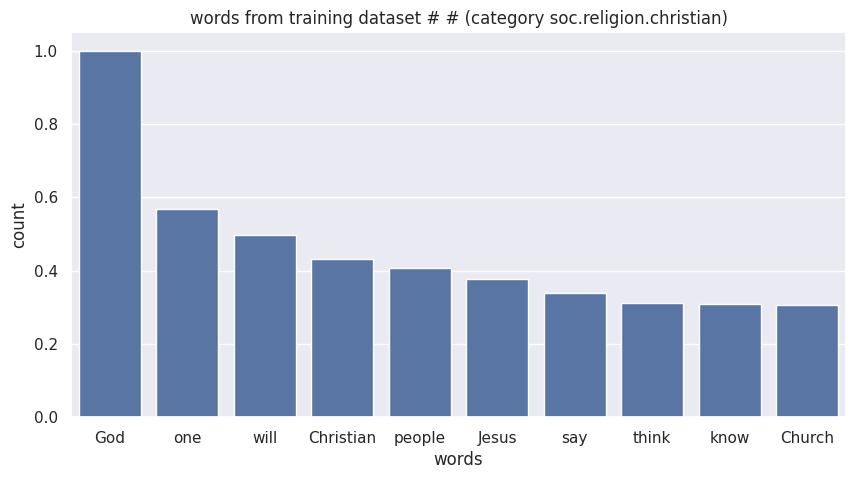

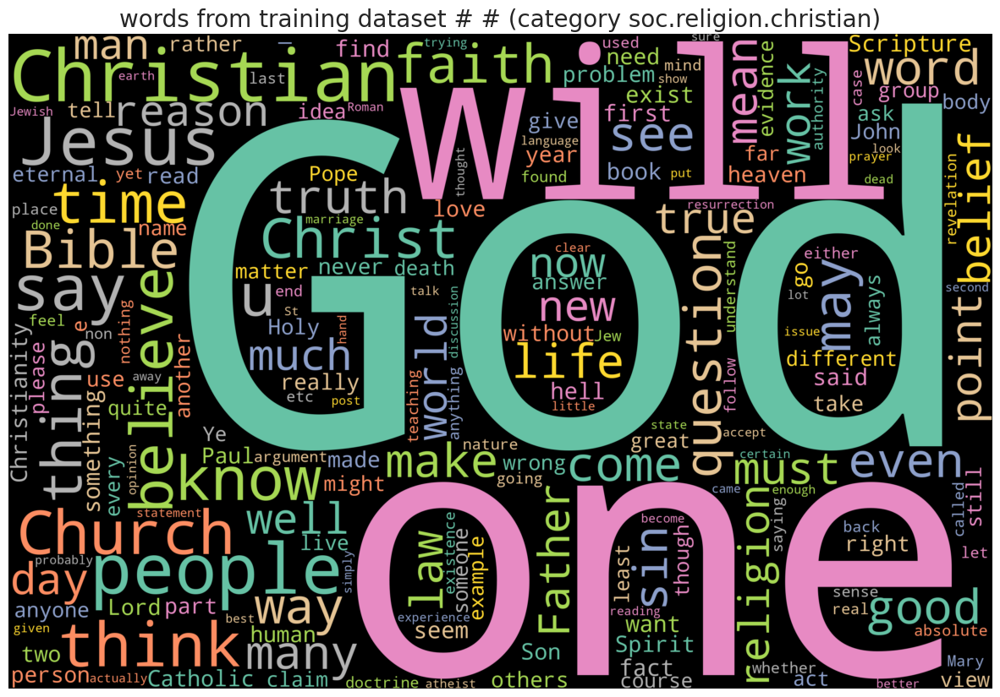

category talk.politics.mideast, top 10 words: ['Armenian', 'people', 'one', 'said', 'Israel', 'Turkish', 'Jew', 'u', 'Israeli', 'will']


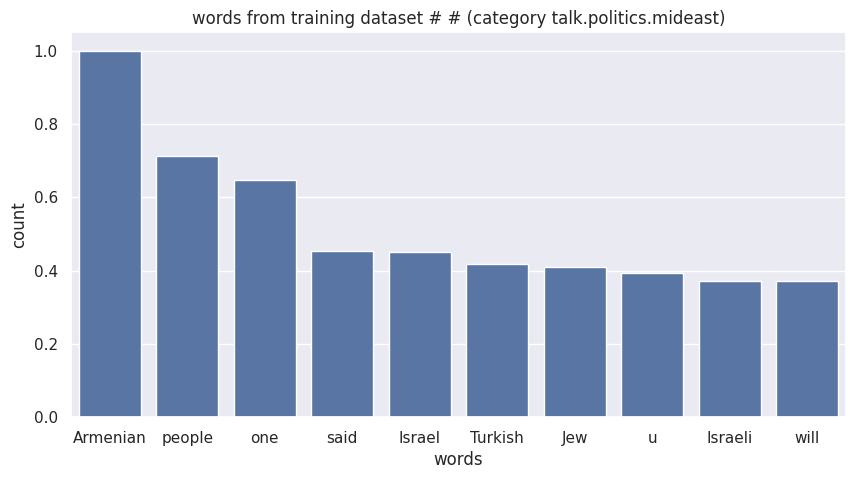

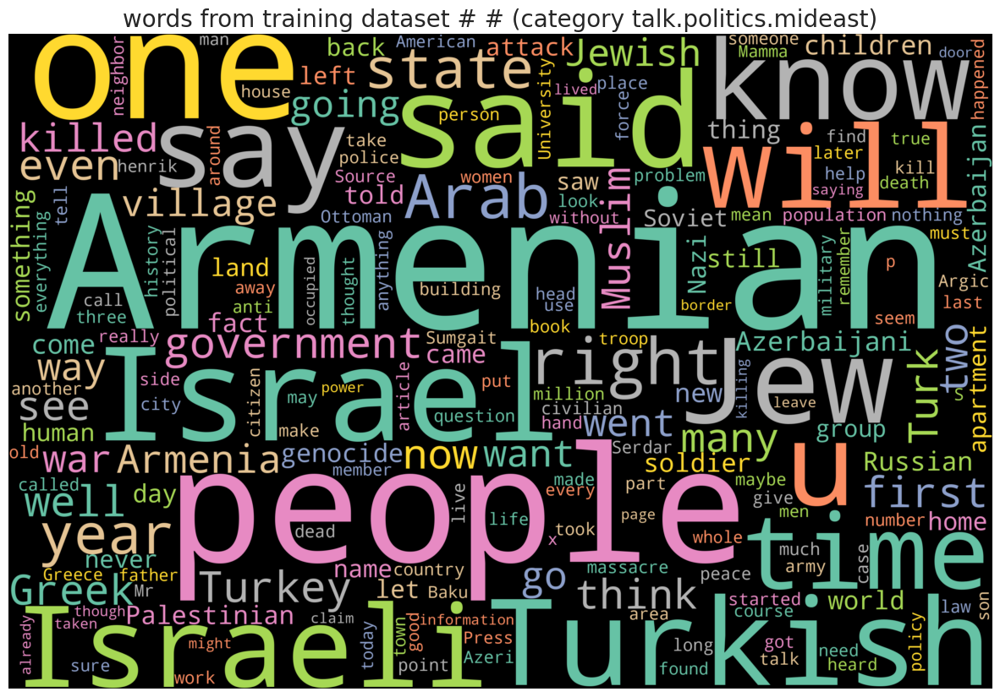

category talk.politics.misc, top 10 words: ['Q', 'people', 'will', 'MR', 'President', 'think', 'one', 'STEPHANOPOULOS', 'know', 'u']


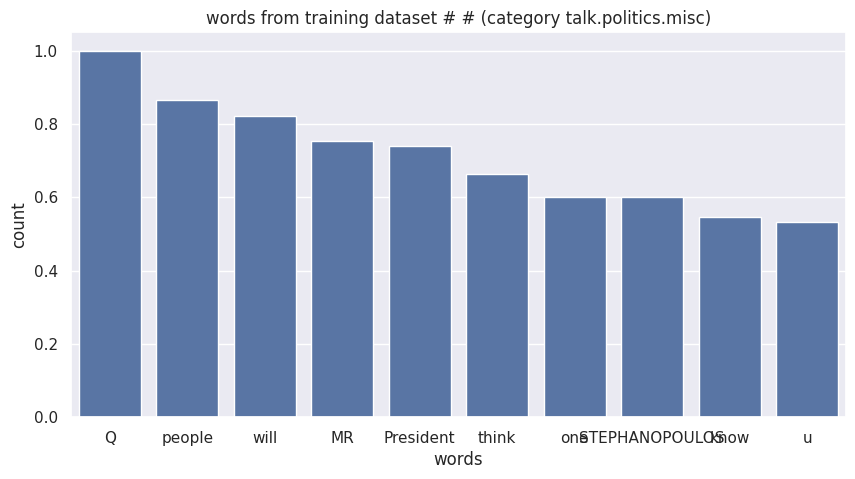

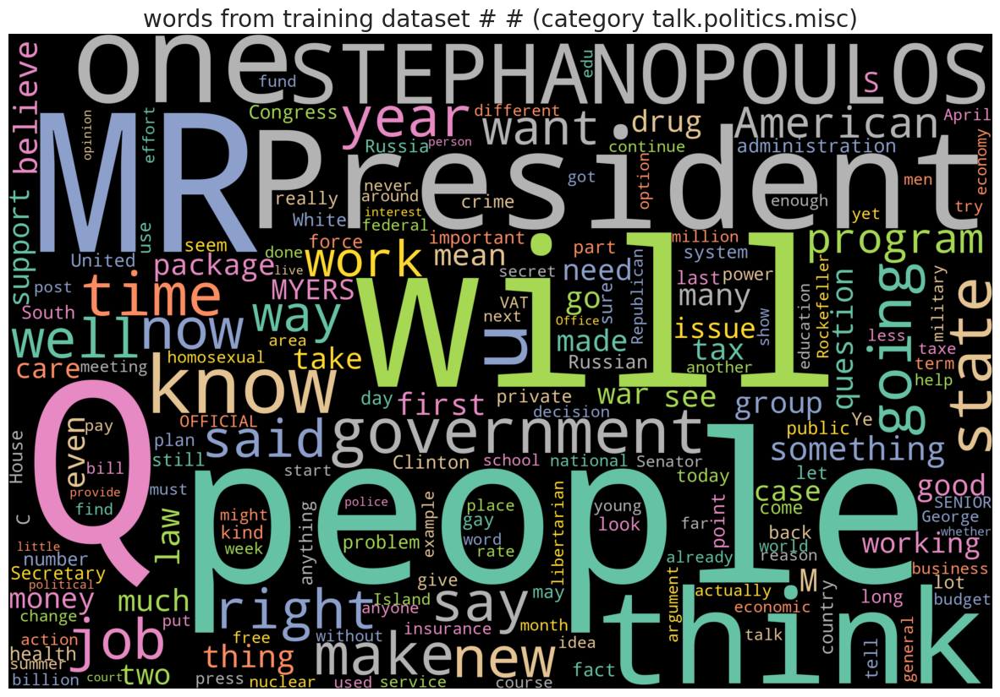

category sci.crypt, top 10 words: ['key', 'will', 'encryption', 'DB', 'chip', 'one', 'use', 'system', 'government', 'Clipper']


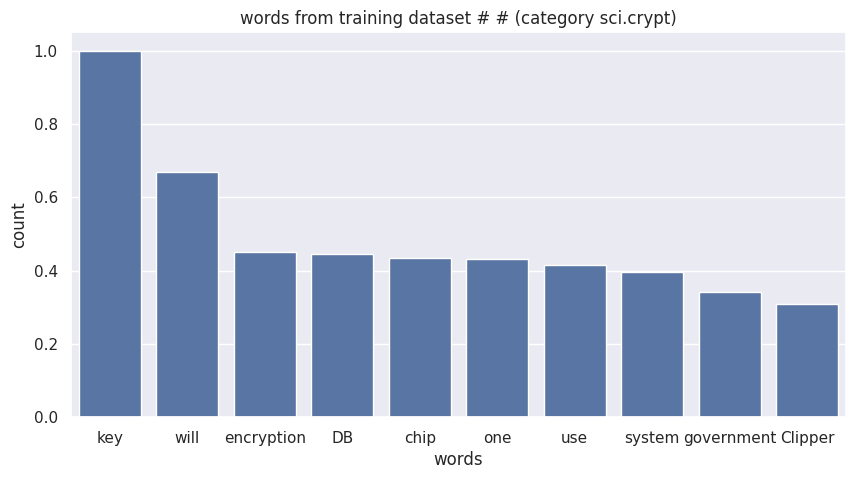

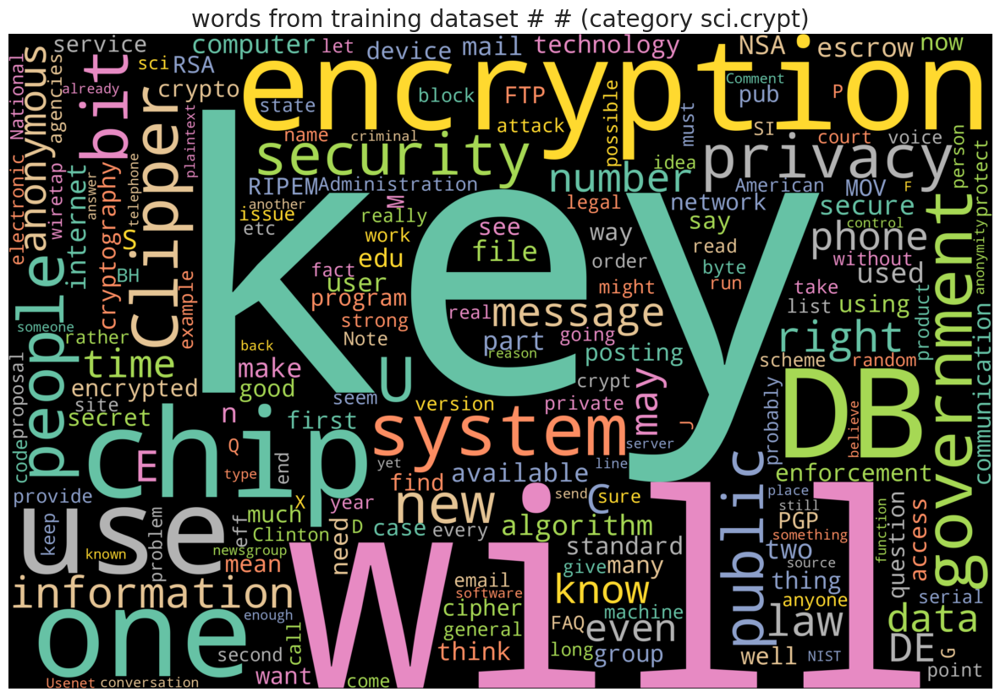

In [28]:
for cat in ds_train['label_text'].unique():
    plot_wordcloud(' '.join(ds_train[ds_train['label_text'] == cat]['text']), f'words from training dataset # # (category {cat})')

In [45]:
import pickle
filename = './models/nmf.sav'
pickle.dump(nmf, open(filename, 'wb'))